<a href="https://colab.research.google.com/github/hernansalinas/autogrades/blob/main/Actividades_clase/Actividad_10_Euler.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Ejercicio: Simulación de un Péndulo Simple con el Método de Euler y RungeKutta

## Objetivo
Simular el movimiento de un péndulo simple  con fricción utilizando el método de Euler y Runge Kutta para resolver las ecuaciones diferenciales que describen su movimiento.

## Descripción del Péndulo Simple
Un péndulo simple consiste en una masa puntual suspendida de un hilo inextensible y sin masa en el cual  la masa oscila bajo la influencia de la gravedad.

## Ecuaciones del Movimiento
Las ecuaciones de movimiento de un péndulo simple de longitud L, en presencia de  fricción, vienen dadas por :

1. Ecuación diferencial de la posición angular:

\begin{equation}
\frac{d^2\theta}{dt^2} + \frac{g}{L}\sin(\theta) + \gamma L \frac{d\theta}{dt}= 0
\end{equation}

donde $\theta$ es el ángulo de desplazamiento, $g=9.8$m/s la aceleración de la gravedad  y  $\gamma$ la constante de amortigüamiento.

2. La ecuación diferencial se puede separar en dos ecuaciones de primer orden:

\begin{equation}
\frac{d\theta}{dt} = \omega
\end{equation}
   
\begin{equation}
\frac{d\omega}{dt} = -\frac{g}{L}\theta - \gamma L \omega
\end{equation}


## Parámetros
- $g$: Aceleración debido a la gravedad (9.81 $m/s^2$)
- $L$: Longitud del hilo del péndulo (en metros)
- $\theta_0$: Ángulo inicial de desplazamiento (en radianes)
- $\omega_0$: Velocidad angular inicial (en radianes/segundo)
- $\Delta t$: Paso de tiempo para la simulación (en segundos)
- $t_{max}$: Tiempo máximo de simulación (en segundos)

## Instrucciones
1. **Inicialización**:
   - Establezca los valores iniciales: $\theta = \theta_0$ y $\omega = \omega_0$.
   - Defina el intervalo de tiempo $\Delta t$ y el tiempo total de simulación $t_{max}$.

2. **Aplicación del Método de Euler y Runge Kutta**:
   - Construya una función con funciones a integrar
   - Construya una función con el método euler y otra para el metodo de rungekutta.
   - Emplee la librería de integración odeint para validar la solución numérica.  
   - Emplee la solución teórica para validar todos los resultados anteriores.
     
3. **Resultados**:
   - Registre los valores de $\theta$ y $\omega$ para cada instante de tiempo.
   - Grafique $\theta$ y $\omega$ en función del tiempo para visualizar el movimiento del péndulo.
   - Encuentre una expresión para determinar la energía cinética, potencial y total del péndulo simple.

## Funciones a Implementar

### 1. `fun`: Función de las Ecuaciones del Péndulo Simple
Esta función calcula las derivadas de las variables de estado $\theta$ y $\omega$ en un instante dado.


```python
def fun(theta, omega, g, L):
    """
    Calcula las derivadas del ángulo y la velocidad angular para un péndulo simple.

    Args:
        theta (float): Ángulo de desplazamiento (en radianes).
        omega (float): Velocidad angular (en radianes/segundo).
        g (float): Aceleración debida a la gravedad (en m/s²).
        L (float): Longitud del hilo del péndulo (en metros).

    Returns:
        Array: Derivadas de theta y omega.
    """
    dtheta_dt = ...
    domega_dt = ...
    return np.array([dtheta_dt, domega_dt])
```

## Preguntas
1. ¿Cómo afecta el paso de tiempo Δt a la precisión de la simulación?
2. ¿Qué sucede si el ángulo inicial $\theta_0$   no es pequeño? ¿Sigue siendo válida la aproximación $\sin \theta \approx \theta$
3. ¿Cómo varía el movimiento del péndulo con respecto a los parámetros $L$ y $\theta_0$
4. ¿Qué observas en la energía del sistema a lo largo del tiempo? ¿Se conserva?
5. ¿Qué diferencias encuentras si comparas los resultados obtenidos con el método de Euler con los obtenidos utilizando métodos más precisos él de Runge-Kutta?
6. Realizar una animación para del movimiento del pendulo simple, con las soluciones dadas en el metodo de RungeKutta.

## Parámetros
- $g$: Aceleración debido a la gravedad (9.81 $m/s^2$)
- $L$: Longitud del hilo del péndulo (en metros)
- $\theta_0$: Ángulo inicial de desplazamiento (en radianes)
- $\omega_0$: Velocidad angular inicial (en radianes/segundo)
- $\Delta t$: Paso de tiempo para la simulación (en segundos)
- $t_{max}$: Tiempo máximo de simulación (en segundos)

## Librerias

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import odeint
import matplotlib.animation as animation
from matplotlib import rc
from IPython.display import HTML

## Parte inicial

In [2]:
# Definimos los parametros del problema
g = 9.81
L = 0.5
gamma = 0.1
theta0 = 0.2
w0 = 0.001
deltat = 0.001
t0 = 0
tmax = 15

In [3]:
# Definimos la funcion con las derivadas del sistema de ecuaciones
def derivadas(y0, t, g, L):
    """
    Calcula las derivadas del ángulo y la velocidad angular para un péndulo simple.

    Args:
        theta (float): Ángulo de desplazamiento (en radianes).
        omega (float): Velocidad angular (en radianes/segundo).
        g (float): Aceleración debida a la gravedad (en m/s²).
        L (float): Longitud del hilo del péndulo (en metros).

    Returns:
        Array: Derivadas de theta y omega.
    """
    theta, w = y0
    dthetadt = w
    dwdt = -(g/L)*theta - gamma*L*w
    return np.array([dthetadt, dwdt])

# Funcion para el calculo del metodo de Euler
def Euler(x0, xmax, y0, z0, h, f, g, L):
  n = int(xmax/h) + 1
  x = np.zeros(n)
  y = np.zeros((n, 2))

  x[0] = x0
  y[0] = np.array([y0, z0])

  for i in range(0, n-1):
    y[i+1] = y[i] + h*f(y[i], x[i], g, L)
    x[i+1] = x[i] + h

  return x, y[:,0], y[:,1]

# Funcion para el calculo del metodo de Runge-Kutta de orden 4
def RK4(x0, xmax, y0, z0, h, f, g, L):
    n = int(xmax/h) + 1
    x = np.zeros(n)
    y = np.zeros((n, 2))

    x[0] = x0
    y[0] = np.array([y0, z0])

    for i in range(0, n-1):
        k1 = f(y[i], x[i], g, L)
        k2 = f(y[i] + h*0.5 * k1, x[i] + h*0.5, g, L)
        k3 = f(y[i] + h*0.5 * k2, x[i] + h*0.5, g, L)
        k4 = f(y[i] + h * k3, x[i] + h, g, L)

        y[i+1] = y[i] + h/6 * (k1 + 2*k2 + 2*k3 + k4)
        x[i+1] = x[i] + h

    return x, y[:,0], y[:,1]

# Funcion para la solucion teorica , funcion dada por chatgpt
def teorico(t, theta0, w0, g, L):
    # Frecuencia angular natural del sistema (sin amortiguamiento)
    omega0 = np.sqrt(g/L)

    # Factor de amortiguamiento
    beta = gamma * L / 2

    # Discriminante del sistema
    discriminant = omega0**2 - beta**2

    if discriminant > 0:
        # Oscilaciones subamortiguadas
        omega_d = np.sqrt(discriminant)
        A = theta0
        B = (w0 + beta * theta0) / omega_d
        theta = np.exp(-beta * t) * (A * np.cos(omega_d * t) + B * np.sin(omega_d * t))
    elif discriminant == 0:
        # Amortiguamiento crítico
        A = theta0
        B = w0 + beta * theta0
        theta = np.exp(-beta * t) * (A + B * t)
    else:
        # Sobreamortiguamiento
        omega_d = np.sqrt(-discriminant)
        A = theta0
        B = (w0 + beta * theta0) / omega_d
        theta = np.exp(-beta * t) * (A * np.cosh(omega_d * t) + B * np.sinh(omega_d * t))

    return theta

In [4]:
# Soluciones con Euler
teuler0, thetaeuler0, weuler0 = Euler(t0, tmax, theta0, w0, deltat, derivadas, g, L)

# Soluciones con RK4
tRK40, thetaRK40, wRK40 = RK4(t0, tmax, theta0, w0, deltat, derivadas, g, L)

# Soluciones con odeint
thetaodeint0, wodeint0 = odeint(derivadas, [theta0, w0], teuler0, args=(g, L))[:,0], odeint(derivadas, [theta0, w0], teuler0, args=(g, L))[:,1]

# Solucion teorica
thetateorico = teorico(teuler0, theta0, w0, g, L)

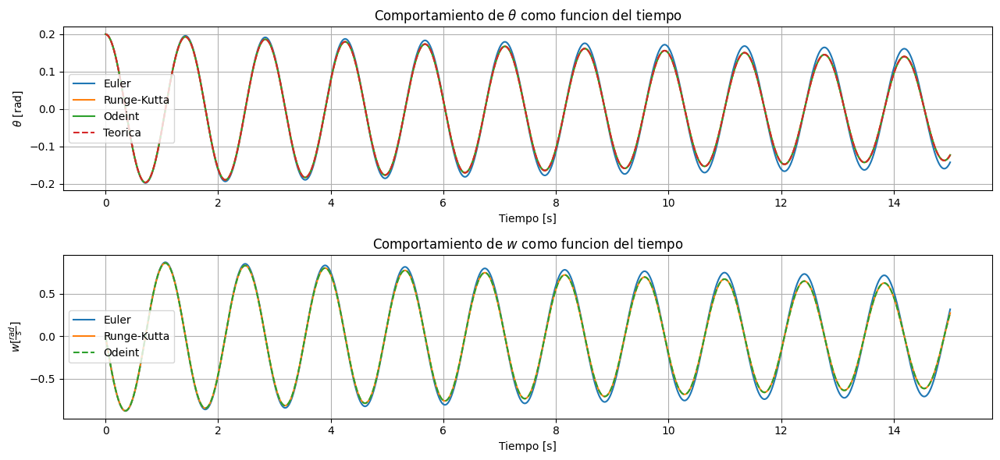

In [5]:
# Graficamos el comportamiento de theta como funcion del tiempo
plt.figure(figsize=(13, 6)) # Tamaño de la figura
plt.subplot(2, 1, 1)
plt.title(r'Comportamiento de $\theta$ como funcion del tiempo')
plt.plot(teuler0, thetaeuler0, label = 'Euler')
plt.plot(tRK40, thetaRK40, label = 'Runge-Kutta')
plt.plot(teuler0, thetaodeint0, label = 'Odeint')
plt.plot(teuler0, thetateorico, '--', label = 'Teorica')
plt.xlabel('Tiempo [s]')
plt.ylabel(r'$\theta$ [rad]')
plt.legend()
plt.grid()

plt.tight_layout()

# Graficamos el comportamiento de w como funcion del tiempo
plt.subplot(2, 1, 2)
plt.title(r'Comportamiento de $w$ como funcion del tiempo')
plt.plot(teuler0, weuler0, label = 'Euler')
plt.plot(tRK40, wRK40, label = 'Runge-Kutta')
plt.plot(teuler0, wodeint0, '--', label = 'Odeint')
#plt.plot(teuler0, wteorico, '--', label = 'Teorica')
plt.xlabel('Tiempo [s]')
plt.ylabel(r'$w [\frac{rad}{s}]$')
plt.legend()
plt.grid()

plt.tight_layout()

##*Expresiones para la energia cinetica, potencial y total del pendulo*

La energia cinetica de un sistema esta dada por: $E_c = \frac{1}{2}mv^2$

Para un péndulo, la velocidad lineal ($v$) está relacionada con la velocidad ángular como $v=lw$

Así, la energía cinética del péndulo será:
\begin{equation}
  E_c = \frac{1}{2}m(Lw)^2
\end{equation}

La energia potencial del sistema esta dada por: $E_p=mgh$

Para le energía potencial del pendulo podemos expresar la altura de la masa en función del ángulo $θ$ como $h=L(1-cos(θ))$

Así la energia potencial del pendulo será:

\begin{equation}
  E_p = mg[L(1-cos(θ))]
\end{equation}

La energia total de un sistema conservativo esta dada por:

\begin{equation}
  E_T=E_c+E_p
\end{equation}

Así la energía total del pendulo será:
\begin{equation}
  E_T=\frac{1}{2}mL^2w^2+mg[L(1-cos(θ))]
\end{equation}

Supondremos que m=1

In [6]:
# Definimos funciones para calcular las energias
# Energia cinetica
def T(m, L, w):

  return 0.5*m*L**2*w**2

# Energia potencial
def V(m, g, L, theta):

  return m*g*L*(1 - np.cos(theta))

# Energia total
def E(m, L, w, g, theta):

  return 0.5*m*L**2*w**2 + m*g*L*(1 - np.cos(theta))

## Pregunta 1.

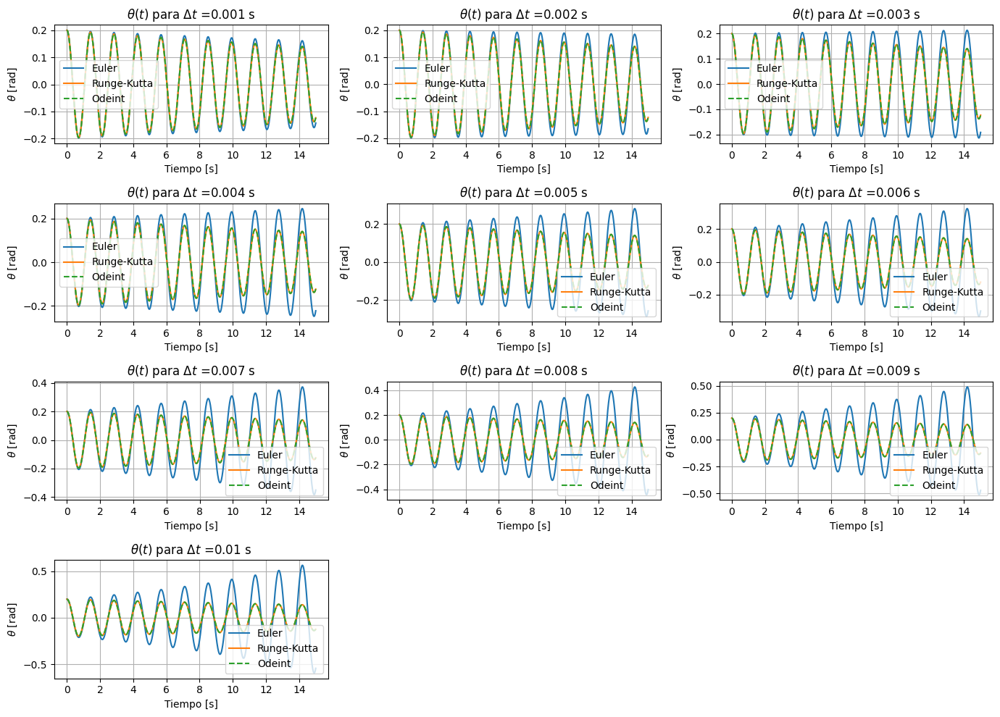

In [7]:
# Variacion de deltat
deltats = np.linspace(0.001, 0.01, 10)

plt.figure(figsize=(14, 10)) # Tamaño de la figura

for i in range(len(deltats)):
  # Soluciones con Euler
  teuler, thetaeuler, weuler = Euler(t0, tmax, theta0, w0, deltats[i], derivadas, g, L)

  # Soluciones con RK4
  tRK4, thetaRK4, wRK4 = RK4(t0, tmax, theta0, w0, deltats[i], derivadas, g, L)

  # Soluciones con odeint
  thetaodeint, wodeint = odeint(derivadas, [theta0, w0], teuler, args=(g, L))[:,0], odeint(derivadas, [theta0, w0], teuler, args=(g, L))[:,1]

  # Graficamos la interpolacion y la funcion
  plt.subplot(4, 3, i+1)  # Subgrafico i

  # Graficamos el comportamiento de theta como funcion del tiempo
  plt.title(r'$\theta(t)$ para $\Delta t$ =' f'{deltats[i]:.1} s')
  plt.plot(teuler, thetaeuler, label = 'Euler')
  plt.plot(tRK4, thetaRK4, label = 'Runge-Kutta')
  plt.plot(teuler, thetaodeint, '--', label = 'Odeint')
  plt.xlabel('Tiempo [s]')
  plt.ylabel(r'$\theta$ [rad]')
  plt.legend()
  plt.grid()

plt.tight_layout()

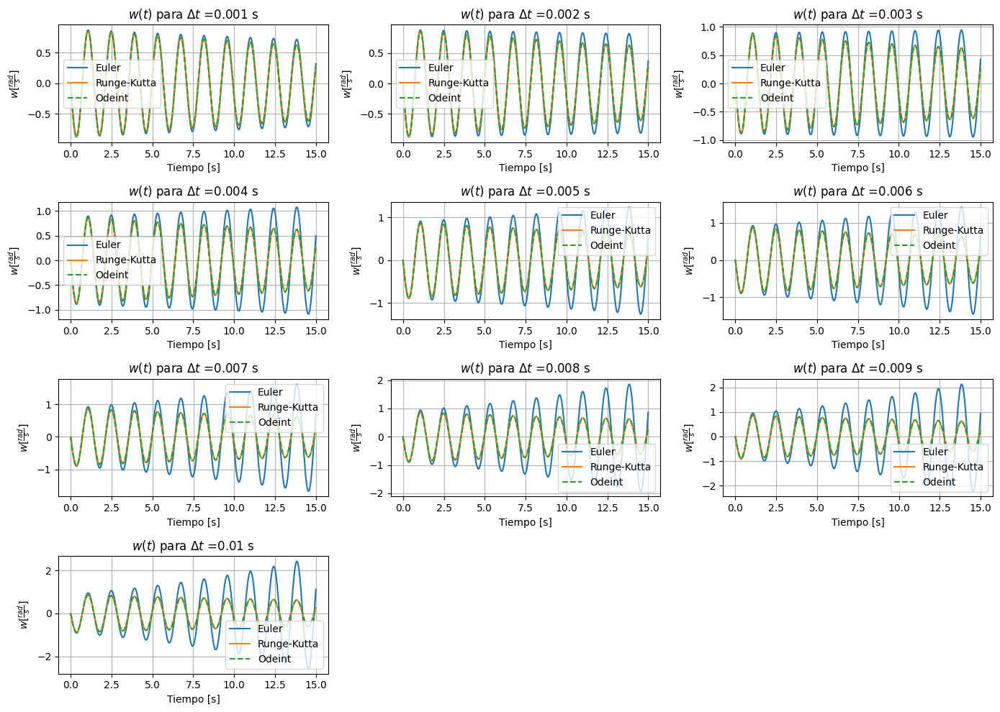

In [8]:
plt.figure(figsize=(14, 10)) # Tamaño de la figura

for i in range(len(deltats)):
  # Soluciones con Euler
  teuler, thetaeuler, weuler = Euler(t0, tmax, theta0, w0, deltats[i], derivadas, g, L)

  # Soluciones con RK4
  tRK4, thetaRK4, wRK4 = RK4(t0, tmax, theta0, w0, deltats[i], derivadas, g, L)

  # Soluciones con odeint
  thetaodeint, wodeint = odeint(derivadas, [theta0, w0], teuler, args=(g, L))[:,0], odeint(derivadas, [theta0, w0], teuler, args=(g, L))[:,1]

  # Graficamos la interpolacion y la funcion
  plt.subplot(4, 3, i+1)  # Subgrafico i

  # Graficamos el comportamiento de w como funcion del tiempo
  plt.title(r'$w(t)$ para $\Delta t$ =' f'{deltats[i]:.1} s')
  plt.plot(teuler, weuler, label = 'Euler')
  plt.plot(tRK4, wRK4, label = 'Runge-Kutta')
  plt.plot(teuler, wodeint, '--', label = 'Odeint')
  plt.xlabel('Tiempo [s]')
  plt.ylabel(r'$w [\frac{rad}{s}]$')
  plt.legend()
  plt.grid()

plt.tight_layout()

Vemos que al variar el $\Delta t$, el método de Euler es el que sufre más imprecisiones, mientras que los métodos de Runge-Kutta y odeint mantienen una solución precisa.

## Pregunta 2.

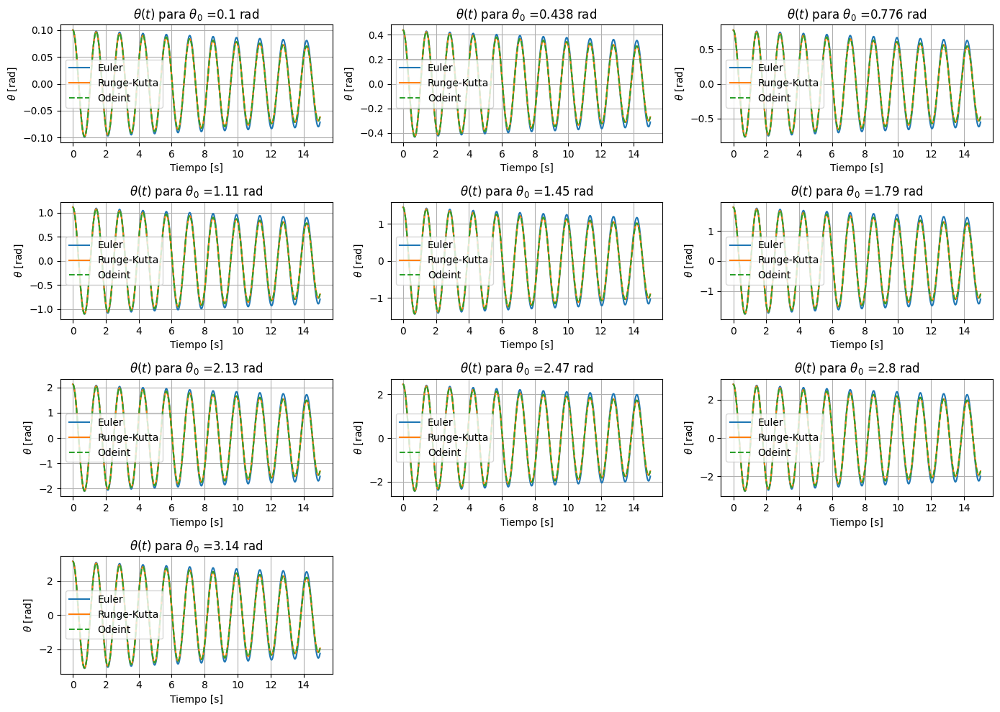

In [9]:
# Variemos ahora theta0
theta0s = np.linspace(0.1, np.pi, 10)

plt.figure(figsize=(14, 10)) # Tamaño de la figura

for i in range(len(theta0s)):
  # Soluciones con Euler
  teuler, thetaeuler, weuler = Euler(t0, tmax, theta0s[i], w0, deltat, derivadas, g, L)

  # Soluciones con RK4
  tRK4, thetaRK4, wRK4 = RK4(t0, tmax, theta0s[i], w0, deltat, derivadas, g, L)

  # Soluciones con odeint
  thetaodeint, wodeint = odeint(derivadas, [theta0s[i], w0], teuler, args=(g, L))[:,0], odeint(derivadas, [theta0s[i], w0], teuler, args=(g, L))[:,1]

  # Graficamos la interpolacion y la funcion
  plt.subplot(4, 3, i+1)  # Subgrafico i

  # Graficamos el comportamiento de theta como funcion del tiempo
  plt.title(r'$\theta(t)$ para $\theta_0$ =' f'{theta0s[i]:.3} rad')
  plt.plot(teuler, thetaeuler, label = 'Euler')
  plt.plot(tRK4, thetaRK4, label = 'Runge-Kutta')
  plt.plot(teuler, thetaodeint, '--', label = 'Odeint')
  plt.xlabel('Tiempo [s]')
  plt.ylabel(r'$\theta$ [rad]')
  plt.legend()
  plt.grid()

plt.tight_layout()

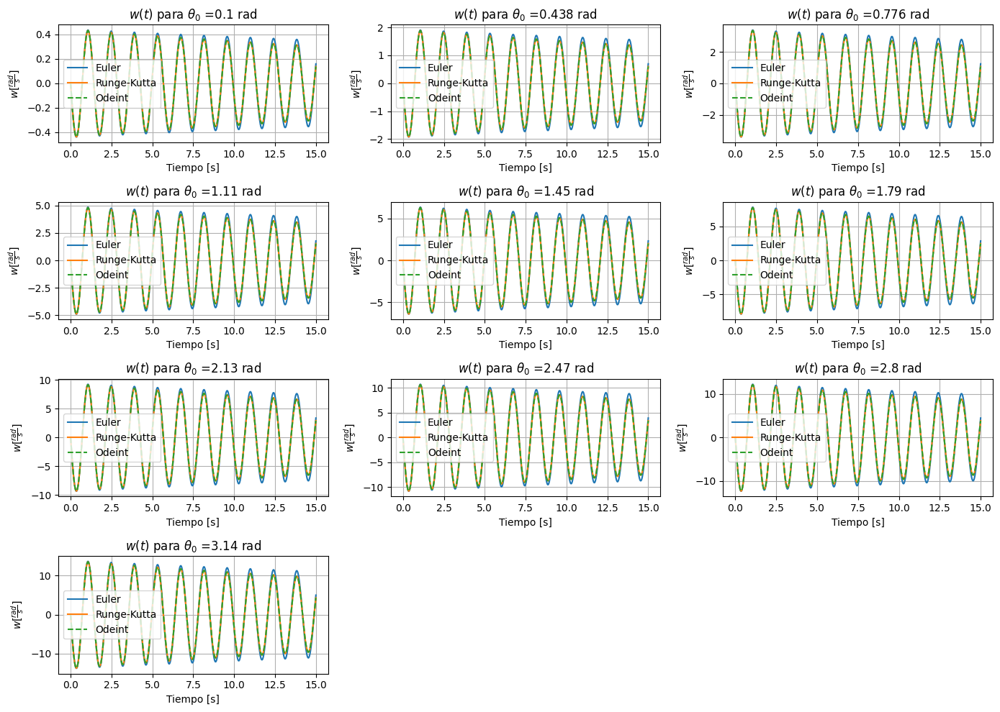

In [10]:
plt.figure(figsize=(14, 10)) # Tamaño de la figura

for i in range(len(theta0s)):
  # Soluciones con Euler
  teuler, thetaeuler, weuler = Euler(t0, tmax, theta0s[i], w0, deltat, derivadas, g, L)

  # Soluciones con RK4
  tRK4, thetaRK4, wRK4 = RK4(t0, tmax, theta0s[i], w0, deltat, derivadas, g, L)

  # Soluciones con odeint
  thetaodeint, wodeint = odeint(derivadas, [theta0s[i], w0], teuler, args=(g, L))[:,0], odeint(derivadas, [theta0s[i], w0], teuler, args=(g, L))[:,1]

  # Graficamos la interpolacion y la funcion
  plt.subplot(4, 3, i+1)  # Subgrafico i

  # Graficamos el comportamiento de w como funcion del tiempo
  plt.title(r'$w(t)$ para $\theta_0$ =' f'{theta0s[i]:.3} rad')
  plt.plot(teuler, weuler, label = 'Euler')
  plt.plot(tRK4, wRK4, label = 'Runge-Kutta')
  plt.plot(teuler, wodeint, '--', label = 'Odeint')
  plt.xlabel('Tiempo [s]')
  plt.ylabel(r'$w [\frac{rad}{s}]$')
  plt.legend()
  plt.grid()

plt.tight_layout()

Vemos que al variar el valor de $\theta_0$ en valores grandes, las soluciones se mantienen válidas. Esto puede deberse a otras variables en el problema, que hacen que el sistema se mantenga estable incluso si se tiene un ángulo grande que no cumple con la aproximación.

## Pregunta 3.

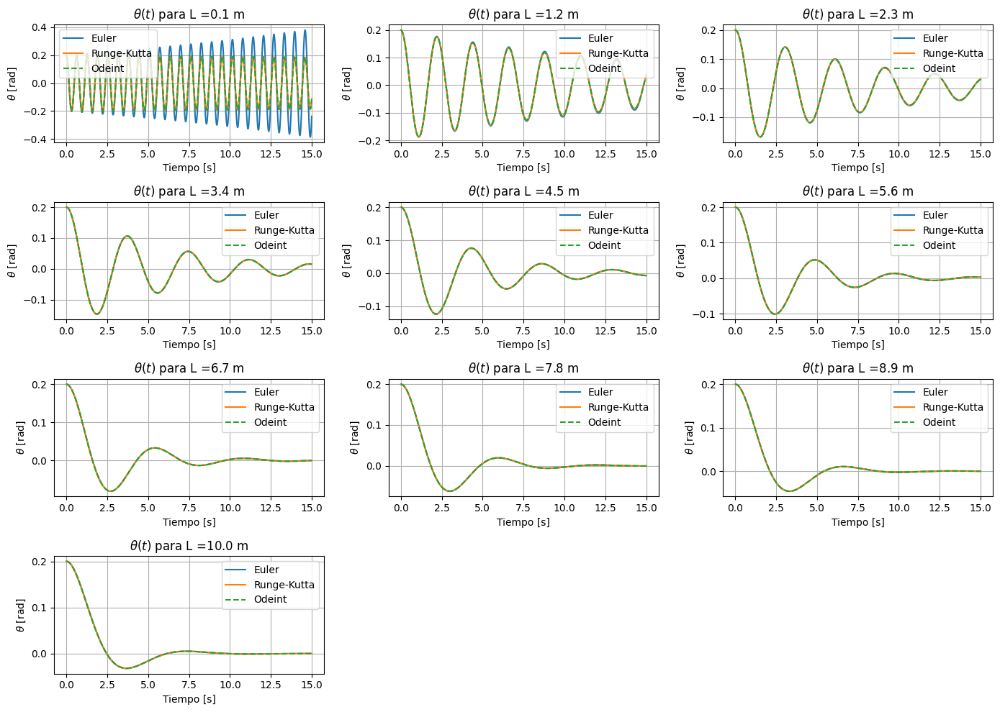

In [11]:
# Variemos ahora L
Ls = np.linspace(0.1, 10, 10)

plt.figure(figsize=(14, 10)) # Tamaño de la figura

for i in range(len(Ls)):
  # Soluciones con Euler
  teuler, thetaeuler, weuler = Euler(t0, tmax, theta0, w0, deltat, derivadas, g, Ls[i])

  # Soluciones con RK4
  tRK4, thetaRK4, wRK4 = RK4(t0, tmax, theta0, w0, deltat, derivadas, g, Ls[i])

  # Soluciones con odeint
  thetaodeint, wodeint = odeint(derivadas, [theta0, w0], teuler, args=(g, Ls[i]))[:,0], odeint(derivadas, [theta0, w0], teuler, args=(g, Ls[i]))[:,1]

  # Graficamos la interpolacion y la funcion
  plt.subplot(4, 3, i+1)  # Subgrafico i

  # Graficamos el comportamiento de theta como funcion del tiempo
  plt.title(r'$\theta(t)$ para L =' f'{Ls[i]:.3} m')
  plt.plot(teuler, thetaeuler, label = 'Euler')
  plt.plot(tRK4, thetaRK4, label = 'Runge-Kutta')
  plt.plot(teuler, thetaodeint, '--', label = 'Odeint')
  plt.xlabel('Tiempo [s]')
  plt.ylabel(r'$\theta$ [rad]')
  plt.legend()
  plt.grid()

plt.tight_layout()

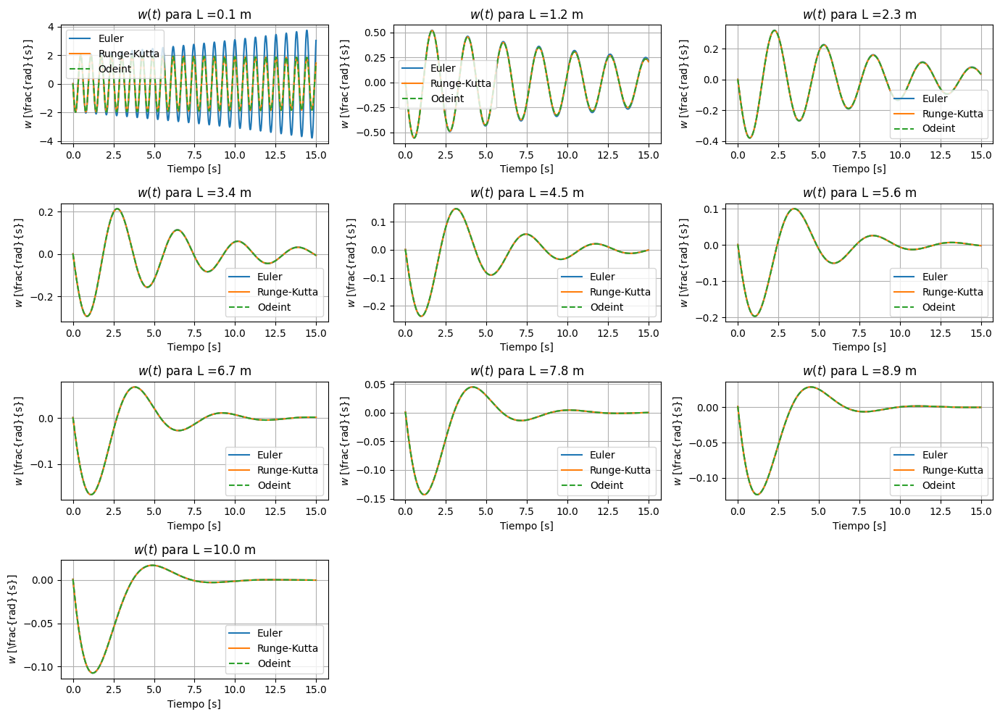

In [12]:
plt.figure(figsize=(14, 10)) # Tamaño de la figura

for i in range(len(Ls)):
  # Soluciones con Euler
  teuler, thetaeuler, weuler = Euler(t0, tmax, theta0, w0, deltat, derivadas, g, Ls[i])

  # Soluciones con RK4
  tRK4, thetaRK4, wRK4 = RK4(t0, tmax, theta0, w0, deltat, derivadas, g, Ls[i])

  # Soluciones con odeint
  thetaodeint, wodeint = odeint(derivadas, [theta0, w0], teuler, args=(g, Ls[i]))[:,0], odeint(derivadas, [theta0, w0], teuler, args=(g, Ls[i]))[:,1]

  # Graficamos la interpolacion y la funcion
  plt.subplot(4, 3, i+1)  # Subgrafico i

  # Graficamos el comportamiento de w como funcion del tiempo
  plt.title(r'$w(t)$ para L =' f'{Ls[i]:.3} m')
  plt.plot(teuler, weuler, label = 'Euler')
  plt.plot(tRK4, wRK4, label = 'Runge-Kutta')
  plt.plot(teuler, wodeint, '--', label = 'Odeint')
  plt.xlabel('Tiempo [s]')
  plt.ylabel(r'$w$ [\frac{rad}{s}]')
  plt.legend()
  plt.grid()

plt.tight_layout()

Vemos que al variar la longitud del péndulo, la forma en que se amortigua cambia significativamente. Podemos decir que la longitud del péndulo afecta al amortiguamiento, aumentando su efecto a medida que la longitud aumenta.

## Pregunta 4.

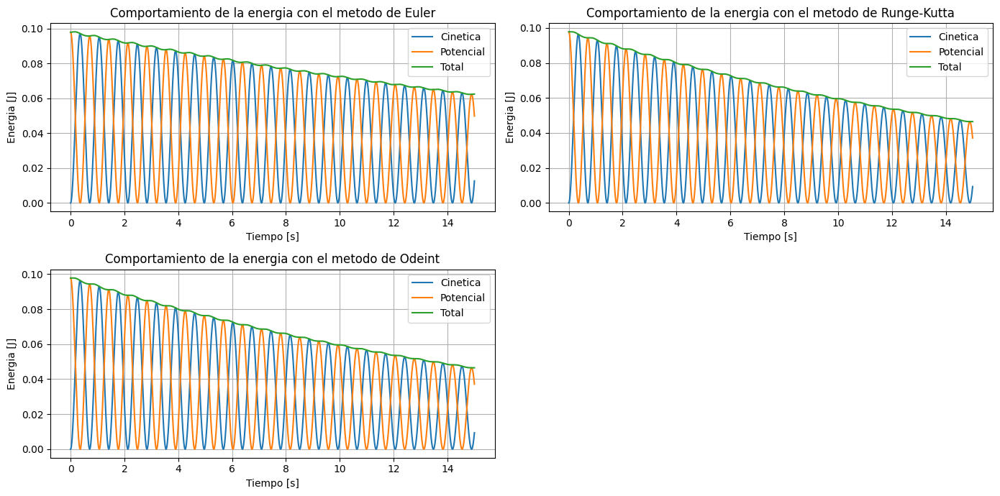

In [13]:
# Calculemos la energia del pendulo para los distintos metodos
# Euler
Teuler = T(1, L, weuler0)
Veuler = V(1, g, L, thetaeuler0)
Eeuler = E(1, L, weuler0, g, thetaeuler0)

# Reunge-Kutta
TRK4 = T(1, L, wRK40)
VRK4 = V(1, g, L, thetaRK40)
ERK4 = E(1, L, wRK40, g, thetaRK40)

# Odeint
Todeint = T(1, L, wodeint0)
Vodeint = V(1, g, L, thetaodeint0)
Eodeint = E(1, L, wodeint0, g, thetaodeint0)

# Graficamos el comportamiento de theta como funcion del tiempo
plt.figure(figsize=(14, 7)) # Tamaño de la figura
plt.subplot(2, 2, 1)
plt.title(r'Comportamiento de la energia con el metodo de Euler')
plt.plot(teuler0, Teuler, label = 'Cinetica')
plt.plot(tRK40, Veuler, label = 'Potencial')
plt.plot(teuler0, Eeuler, label = 'Total')
plt.xlabel('Tiempo [s]')
plt.ylabel(r'Energia [J]')
plt.legend()
plt.grid()

plt.tight_layout()

# Graficamos el comportamiento de w como funcion del tiempo
plt.subplot(2, 2, 2)
plt.title(r'Comportamiento de la energia con el metodo de Runge-Kutta')
plt.plot(teuler0, TRK4, label = 'Cinetica')
plt.plot(tRK40, VRK4, label = 'Potencial')
plt.plot(teuler0, ERK4, label = 'Total')
plt.xlabel('Tiempo [s]')
plt.ylabel(r'Energia [J]')
plt.legend()
plt.grid()

plt.tight_layout()

# Graficamos el comportamiento de w como funcion del tiempo
plt.subplot(2, 2, 3)
plt.title(r'Comportamiento de la energia con el metodo de Odeint')
plt.plot(teuler0, Todeint, label = 'Cinetica')
plt.plot(tRK40, Vodeint, label = 'Potencial')
plt.plot(teuler0, Eodeint, label = 'Total')
plt.xlabel('Tiempo [s]')
plt.ylabel(r'Energia [J]')
plt.legend()
plt.grid()

plt.tight_layout()

Podemos observar en las gráficas que, con los valores iniciales utilizados, la energía se conserva en todos los métodos empleados, ya que siempre se cumple que $E_T = E_c + E_p$. Por lo tanto, la energía se conserva en el sistema.

## Pregunta 5.

Al analizar las gráficas obtenidas de las energías y comparar el método de Euler con los otros dos métodos más precisos, se observa una gran diferencia en la rapidez con la que decrece la energía. Dado que el péndulo está amortiguado por la fricción del aire, perderá su movimiento hasta detenerse. Al comparar los métodos, se nota que en el método de Euler la energía total decrece menos que en los otros métodos. Esto puede indicar que el método de Euler no es muy preciso y pierde exactitud al calcular oscilaciones amortiguadas. En todos los análisis anteriores, también se observa que el ángulo y la velocidad angular parecen aumentar con el método de Euler, lo que introduce muchas imprecisiones en la solución.

# Pregunta 6.

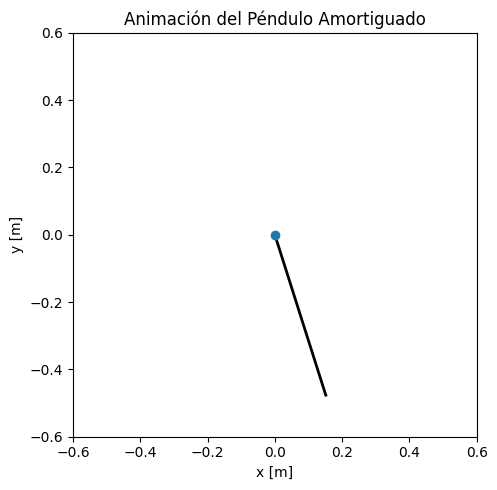

In [14]:
# Habilitar la animación en el notebook de Colab
rc('animation', html='jshtml')

# Ajustamos los parámetros iniciales para la animacion
theta0a = np.pi/3
deltata = 0.1
tmaxa = 30

# Calculo de las soluciones
tRK4a, thetaRK4a, omegaRK4a = RK4(t0, tmaxa, theta0a, w0, deltata, derivadas, g, L)

# Crear la figura y el eje
fig, ax = plt.subplots(figsize=(12, 5))
ax.set_xlim(-L - 0.1, L + 0.1)
ax.set_ylim(-L - 0.1, L + 0.1)
ax.set_aspect('equal')

# Inicializar el gráfico
ph, = ax.plot([], 'k', lw=2)
ax.plot(0, 0, "o")  # Pivote del péndulo
ax.set_title("Animación del Péndulo Amortiguado")
ax.set_xlabel("x [m]")
ax.set_ylabel("y [m]")

# Función de inicialización
def init():
    ph.set_data([], [])
    return ph,

# Función de animación
def graficar(i):
    x = L * np.sin(thetaRK4a[i])
    y = -L * np.cos(thetaRK4a[i])
    ph.set_data([0, x], [0, y])
    return ph,

# Crear la animación
animacion = animation.FuncAnimation(fig, graficar, frames=len(tRK4a), init_func=init, blit=True, interval=20)
plt.tight_layout()

animacion